CONTEXT: Company X owns a movie application and repository which caters movie streaming to millions of users who on subscription basis. Company wants to automate the process of cast and crew information in each scene from a movie such that when a user pauses on the movie and clicks on cast information button, the app will show details of the actor in the scene. Company has an in-house computer vision and multimedia experts who need to detect faces from screen shots from the movie scene.

DATA DICTIONARY

LABEL : Identifies the object in the image.
NOTES: Additional comments (currently empty)
POINTS: Co-ordinates of the mask. (top left and bottom right)
IMAGE WIDTH: Width of the image in pixels.
IMAGE HEIGHT: Height of the image in pixels.

In [1]:
# Importing the Libraries
import numpy as np
import pandas as pd
import PIL
from PIL import Image
import matplotlib.pyplot as plt

### 1. Data Preprocessing and visualization



Import the data 'Images.npy'

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# loading the path of image.
data = np.load('/content/drive/My Drive/CVImages.npy', allow_pickle= True)


In [4]:
data.shape


(393, 2)

In [5]:
print("Shape of images:", data.shape)
print("Data type:", data.dtype)

Shape of images: (393, 2)
Data type: object


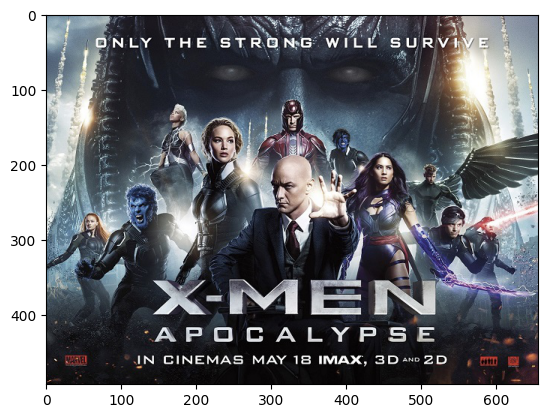

In [6]:
for i in range(len(data)):
  # Assuming data[i] contains image data as a NumPy array
  # If data[i] is not an image, you may need to extract the image data from it
  image_data = data[i][0]  # Accessing the first element, which is assumed to be the image data

  # Convert the image data to the correct dtype if necessary
  image_data = image_data.astype(np.uint8) # or np.float32 depending on your image data

  plt.imshow(image_data, cmap='gray')


In [7]:
image_data[i][0]

array([ 78,  91, 100], dtype=uint8)

Split the images and their masks into two objects,

In [8]:
# Check the type of individual elements
print("First image type:", type(data[0, 0]))
print("First mask type:", type(data[0, 1]))

First image type: <class 'numpy.ndarray'>
First mask type: <class 'list'>


In [9]:
# Check shapes of individual images and masks
for i in range(5):  # Inspect the first 5 samples
    print(f"Sample {i} - Image shape: {np.array(data[i, 0]).shape}, Mask shape: {np.array(data[i, 1]).shape}")

Sample 0 - Image shape: (333, 650, 3), Mask shape: (2,)
Sample 1 - Image shape: (697, 1280, 4), Mask shape: (1,)
Sample 2 - Image shape: (291, 600, 4), Mask shape: (1,)
Sample 3 - Image shape: (326, 580, 3), Mask shape: (6,)
Sample 4 - Image shape: (500, 500, 3), Mask shape: (2,)


Images and masks have inconsistent shapes, we need to reshape them properly.

In [10]:
# Check if any element is a dictionary
for i in range(len(data)):
    if isinstance(data[i, 0], dict) or isinstance(data[i, 1], dict):
        print(f"Found dictionary at index {i}: {data[i]}")

In [11]:
import numpy as np
import cv2

target_shape = (224, 224)

reshaped_images = []
reshaped_masks = []

for i in range(len(data)):
    image = data[i, 0]
    mask = data[i, 1]

    # Resizing or padding for image
    if image.shape != target_shape:
        # Ensure image is grayscale and has the target shape
        image = cv2.resize(image, target_shape, interpolation=cv2.INTER_AREA)
        # Check if image has 4 channels (RGBA)
        if len(image.shape) == 3 and image.shape[2] == 4:
            # Convert RGBA to RGB by dropping the alpha channel
            image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)
        # Check if image is RGB (3 channels)
        if len(image.shape) == 3 and image.shape[2] == 3:
            # Convert RGB to grayscale
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    # Convert mask to NumPy array if it's a list
    if isinstance(mask, list):
        # Assuming the mask data is in 'points' key of the first dictionary in the list
        mask_points = mask[0]['points']
        # Create an empty mask image
        mask_image = np.zeros(target_shape, dtype=np.uint8)
        # Convert mask_points to the correct format for fillPoly
        # Extract x and y coordinates and convert them to integers
        polygon_points = np.array([(int(point['x'] * target_shape[1]), int(point['y'] * target_shape[0])) for point in mask_points], dtype=np.int32)
        # Reshape to (number_of_points, 1, 2) format
        polygon_points = polygon_points.reshape((-1, 1, 2))

        # Draw the polygon defined by mask_points on the mask image
        cv2.fillPoly(mask_image, [polygon_points], 255)
        mask = mask_image

    # Resizing or padding for mask (similar approach)
    if mask.shape != target_shape:
        mask = cv2.resize(mask, target_shape, interpolation=cv2.INTER_NEAREST)  # Nearest neighbor for masks


    # Ensure image and mask have the expected shape before appending
    if image.shape == target_shape and mask.shape == target_shape:
        reshaped_images.append(image)
        reshaped_masks.append(mask)
    else:
        print(f"Skipping sample {i} due to shape mismatch: Image shape - {image.shape}, Mask shape - {mask.shape}")

# Stacking reshaped images and masks back into a NumPy array
reshaped_data = np.stack((np.array(reshaped_images), np.array(reshaped_masks)), axis=1)

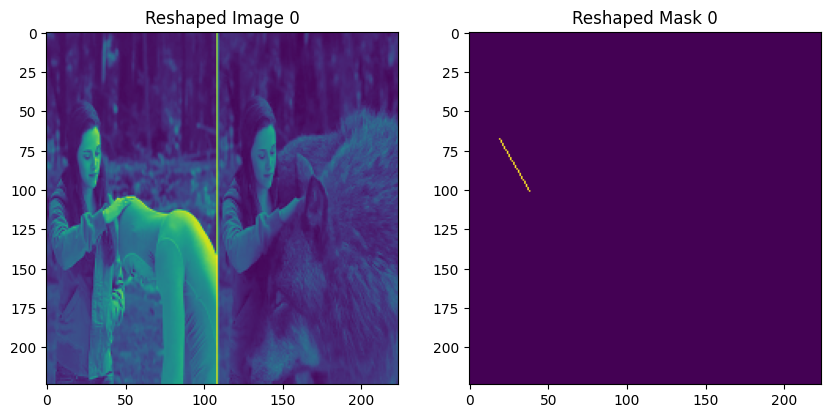

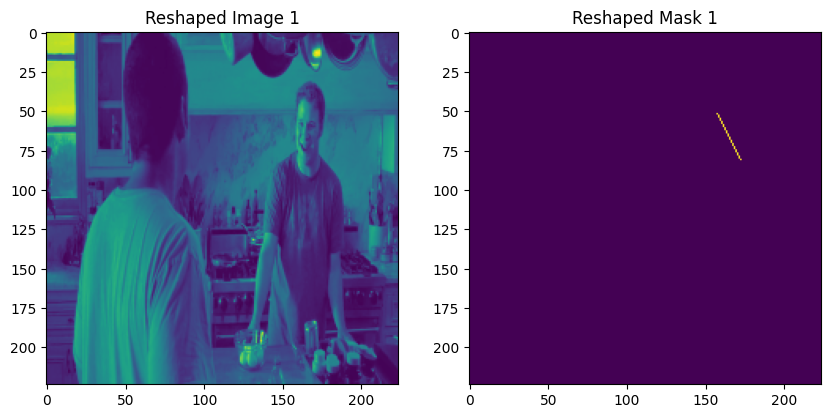

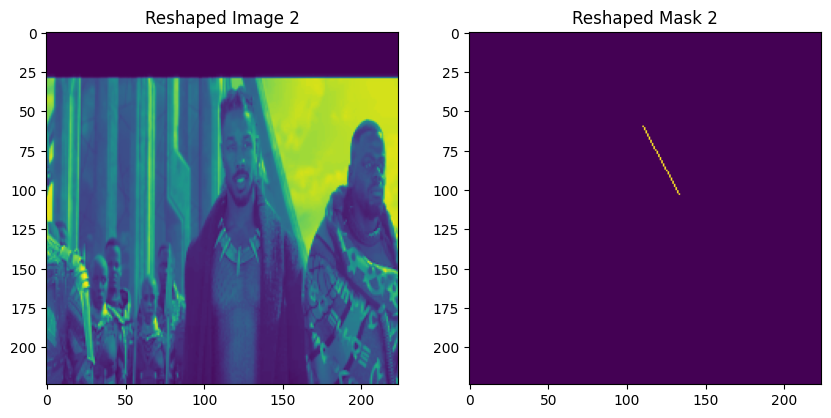

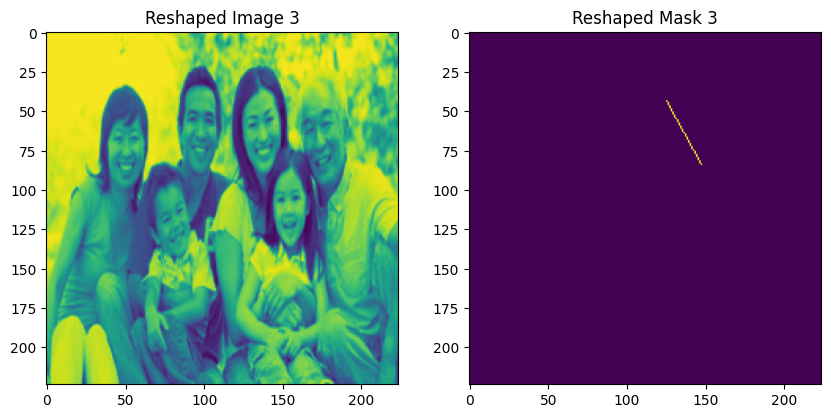

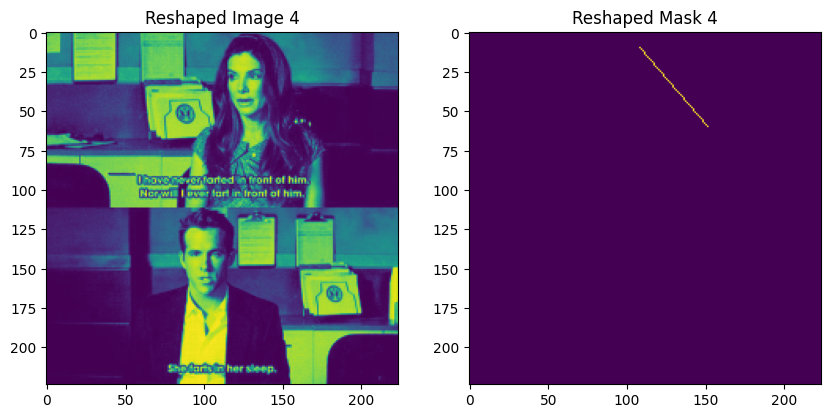

In [12]:
# Visualization
# Display a few reshaped images and masks
for i in range(5):  # Display the first 5 samples
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(reshaped_images[i])
    plt.title(f"Reshaped Image {i}")

    plt.subplot(1, 2, 2)
    plt.imshow(reshaped_masks[i])
    plt.title(f"Reshaped Mask {i}")

    plt.show()


We could see the re-sized images and mask seperately.

In [13]:
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
images = np.array(reshaped_images)  # Convert list of images to NumPy array
masks = np.array(reshaped_masks)    # Convert list of masks to NumPy array

# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, Y_train, Y_test = train_test_split(images, masks, test_size=0.2, random_state=42)

# Print the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("Y_train shape:", Y_train.shape)
print("Y_test shape:", Y_test.shape)

X_train shape: (314, 224, 224)
X_test shape: (79, 224, 224)
Y_train shape: (314, 224, 224)
Y_test shape: (79, 224, 224)


In [14]:
!pip install tensorflow

In [15]:
# loading libraries
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.python.keras import losses

from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.utils import plot_model


In [16]:
# Create the U-Net model, specifying image and mask height and width

image_height= 224
image_width = 224
image_channels = 3

In [17]:
def unet_model(input_shape=(224, 224,3)):
    input_layer = Input(shape=input_shape) # Created an Input layer

    conv1 = Conv2D(16, (3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(16, (3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    drop1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(32, (3, 3), activation="relu", padding="same")(drop1)
    conv2 = Conv2D(32, (3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    drop2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(64, (3, 3), activation="relu", padding="same")(drop2)
    conv3 = Conv2D(64, (3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    drop3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(128, (3, 3), activation="relu", padding="same")(drop3)
    conv4 = Conv2D(128, (3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    drop4 = Dropout(0.5)(pool4)

    conv_middle = Conv2D(256, (3, 3), activation="relu", padding="same")(drop4)
    conv_middle = Conv2D(256, (3, 3), activation="relu", padding="same")(conv_middle)

    deconv4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding="same")(conv_middle)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(128, (3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(128, (3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(64, (3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(64, (3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(32, (3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(32, (3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(16, (3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(16, (3, 3), activation="relu", padding="same")(uconv1)

    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)

    model = Model(inputs=input_layer, outputs=output_layer) # Created a Model instance

    return model

In [18]:
# Create the U-Net model
model = unet_model()

In [19]:
# Print model summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 224, 224, 16)   │            448 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 224, 224, 16)   │          2,320 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 112, 112, 16)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 112, 112, 16)   │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 112, 112, 32)   │          4,640 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 112, 112, 32)   │          9,248 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 56, 56, 32)     │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 56, 56, 32)     │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 56, 56, 64)     │         18,496 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 56, 56, 64)     │         36,928 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 28, 28, 64)     │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 28, 28, 64)     │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 28, 28, 128)    │         73,856 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 28, 28, 128)    │        147,584 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 14, 14, 128)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 14, 14, 128)    │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)    

 Total params: 2,165,633 (8.26 MB)

 Trainable params: 2,165,633 (8.26 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
#!apt-get install graphviz -y # Install Graphviz
from keras.utils import plot_model  # Explicitly import plot_model

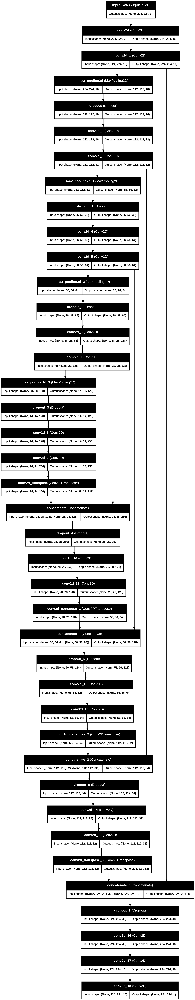

In [21]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)


In [22]:
# Reshape X_train and X_test to have 3 channels before the first model.fit call:
X_train = X_train.reshape((-1, 224, 224, 1))
X_train = np.repeat(X_train, 3, axis=-1)
X_test = X_test.reshape((-1, 224, 224, 1))
X_test = np.repeat(X_test, 3, axis=-1)

In [23]:
from keras.callbacks import ReduceLROnPlateau

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',  # Monitor validation loss
                                            patience=3,         # Wait for 3 epochs before reducing LR
                                            verbose=1,         # Print messages when LR is reduced
                                            factor=0.5,        # Reduce LR by a factor of 0.5
                                            min_lr=0.00001)   # Minimum learning rate


In [24]:
# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [25]:
batch_size = 32
epochs = 10

In [26]:
# Fit the model (Only one fit call)
history = model.fit(X_train,
                    Y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    verbose=1)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 69s 4s/step - accuracy: 0.6331 - loss: 1.9090 - val_accuracy: 0.8514 - val_loss: 0.7047
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - accuracy: 0.6606 - loss: 0.7727 - val_accuracy: 0.9155 - val_loss: 0.6607
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - accuracy: 0.8807 - loss: 0.6730 - val_accuracy: 0.9792 - val_loss: 0.6523
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 0.9405 - loss: 0.6747 - val_accuracy: 0.9905 - val_loss: 0.6424
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 234ms/step - accuracy: 0.9721 - loss: 0.6628 - val_accuracy: 0.9932 - val_loss: 0.6404
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.9824 - loss: 0.6523 - val_accuracy: 0.9943 - val_loss: 0.6298
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - accuracy: 0.9897 - loss: 0.6384 - val_accuracy: 0.9955 - val_loss: 0.6255
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.9933 - loss: 0.6362 - val_accuracy: 0.9959 - val_loss: 

The performance metrics of this model indicates that the model have achieved high accuracy (around 99.45%) on both the training and validation sets. The loss values are also relatively low, suggesting that the model is performing well.

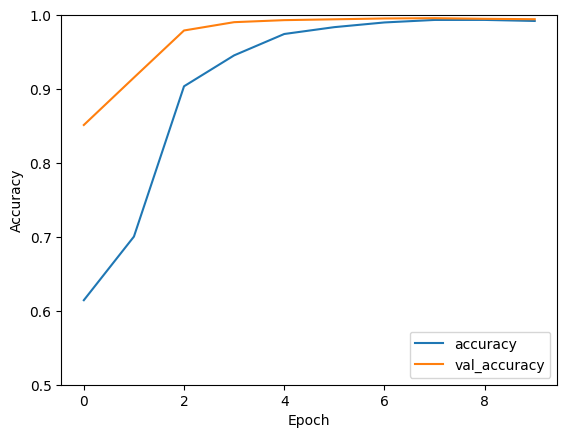

In [27]:
# plotting training and validation accuracy

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right');

In [28]:
# Evaluate the model.
score = model.evaluate(X_test, Y_test, verbose=0, batch_size = 24)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.6420490145683289
Test accuracy: 0.9938614368438721


Test Accuracy:

There is an accuracy of 99.38%, which means that the model is correctly classifying approximately 99.38% of the pixels in the test images.
This is a very high accuracy, indicating excellent performance.

Test Loss: While the loss value of 0.642 might seem relatively high but for image segmentation tasks this is ok.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


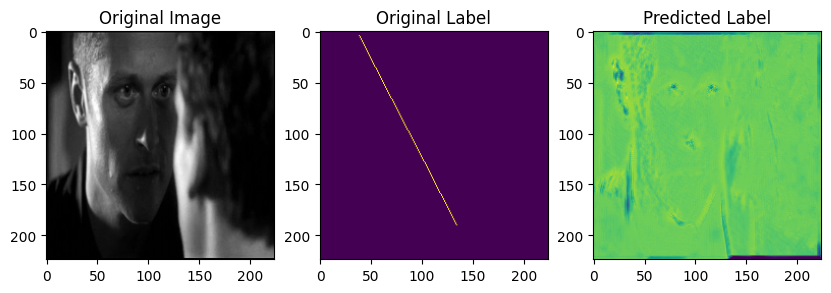

In [29]:
# Visualizing the prediction


def predict(image_index):
  fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,10))
  ax1.imshow(X_test[image_index])
  ax1.set_title("Original Image")
  ax2.imshow(Y_test[image_index])
  ax2.set_title("Original Label")
  ax3.imshow(model.predict(X_test[image_index].reshape(1,224,224,3))[0])
  ax3.set_title("Predicted Label")
  plt.show()

image_index=4
predicted_mask = model.predict(X_test[image_index].reshape(1, 224, 224, 3))[0]
predicted_mask = (predicted_mask * 255).astype(np.uint8)  # Convert to uint8

predict(image_index)


Conclusion:
The model has achieved a accuracy of 99% on the test data.
The model accuracy is mostly constant, reducing learning rate works well.


### Design Dice coefficient and loss function

In [30]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

In [31]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [32]:
def bce_dice_loss(y_true, y_pred):
    loss = losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

This function calculates the dice coefficient between the predicted and true masks in a segmentation task.
The dice coefficient is a common evaluation metric for image segmentation, which measures the overlap between two binary masks.

It is calculated as twice the intersection of the predicted and true masks divided by the sum of the number of pixels in both masks.

The function takes two arguments, y_true and y_pred, which are the ground truth and predicted masks, respectively. The function first flattens both masks into 1D arrays using tf.reshape(). Then, it calculates the intersection of the two masks by element-wise multiplication of the flattened arrays and summing the result. Next, it calculates the sum of pixels in both masks using tf.reduce_sum().

Finally, it applies the dice coefficient formula and returns the result. The smooth variable is used to avoid division by zero errors when both masks are empty.

This function computes the sum of binary cross-entropy loss and Dice coefficient loss between the true and predicted masks.

The binary cross-entropy loss measures the difference between the predicted and true masks pixel-wise.

The Dice coefficient loss measures the overlap between the predicted and true masks. By summing these two losses, the model is encouraged to predict masks that are both accurate and have high overlap with the true masks.

### **Predicting Face Masks from Images**

In [33]:
!unzip '/content/drive/My Drive/training_images.zip' -d '/content/drive/My Drive/face_images'

Archive:  /content/drive/My Drive/training_images.zip
replace /content/drive/My Drive/face_images/training_images/real_00947.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: /content/drive/My Drive/face_images/training_images/real_00947.jpg  
replace /content/drive/My Drive/face_images/training_images/real_01052.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/drive/My Drive/face_images/training_images/real_01052.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_01042.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_00964.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_01053.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_00971.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_01057.jpg  
  inflating: /content/drive/My Drive/face_images/training_images/real_01044.jpg  
  inflating: /content/drive/My Drive/face_images/training_

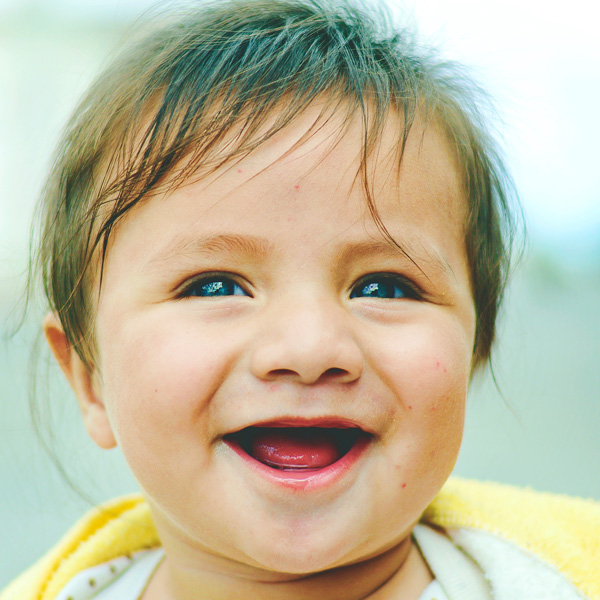

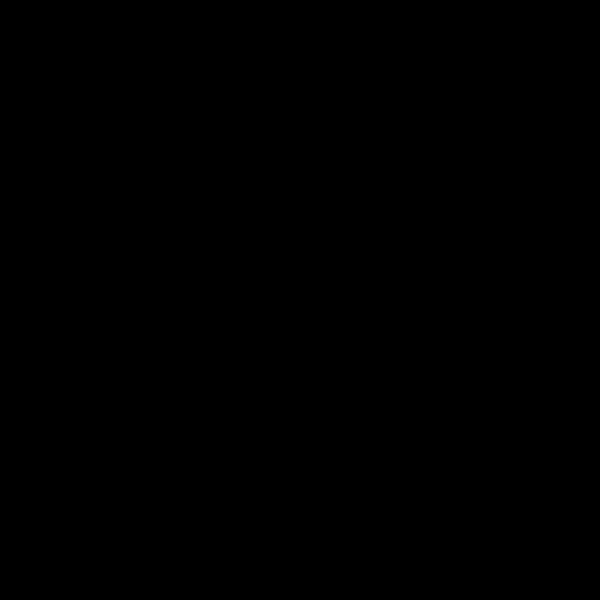

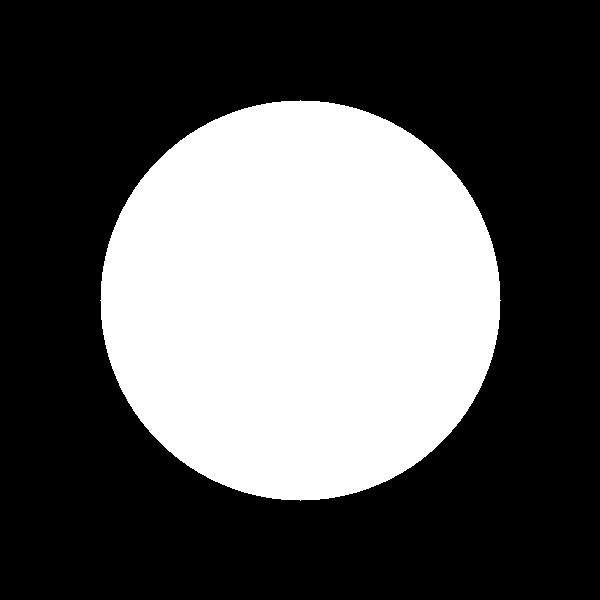

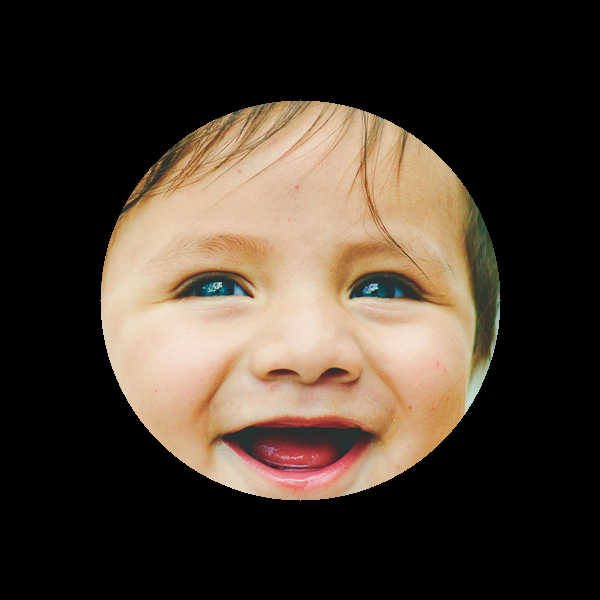

-1

In [37]:
import cv2
from google.colab.patches import cv2_imshow

image_path = '/content/drive/My Drive/face_images/training_images/real_00134.jpg'
img = cv2.imread(image_path)

if img is None:
    print(f"Error: Could not load image from {image_path}. Please check the path and file.")
else:
    cv2_imshow(img)

blank = np.zeros(img.shape[:2], dtype='uint8')
cv2_imshow(blank)

circle = cv2.circle(blank, (img.shape[1]//2,img.shape[0]//2),200,255, -1)
cv2_imshow(circle)

masked = cv2.bitwise_and(img,img,mask=circle)
cv2_imshow(masked)

cv2.waitKey(0)

### Write a loop which will iterate through all the images in the training_images folder and detect the faces present on all the images.



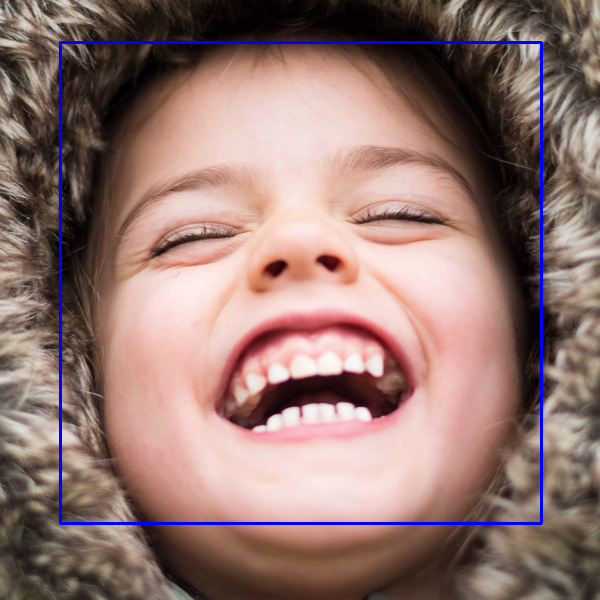

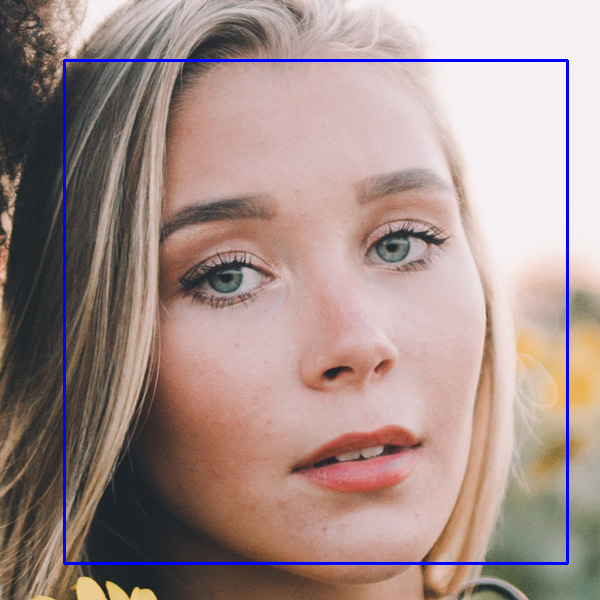

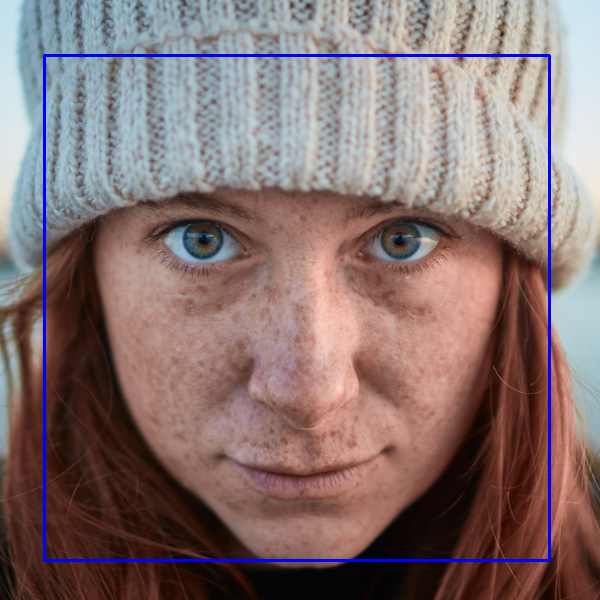

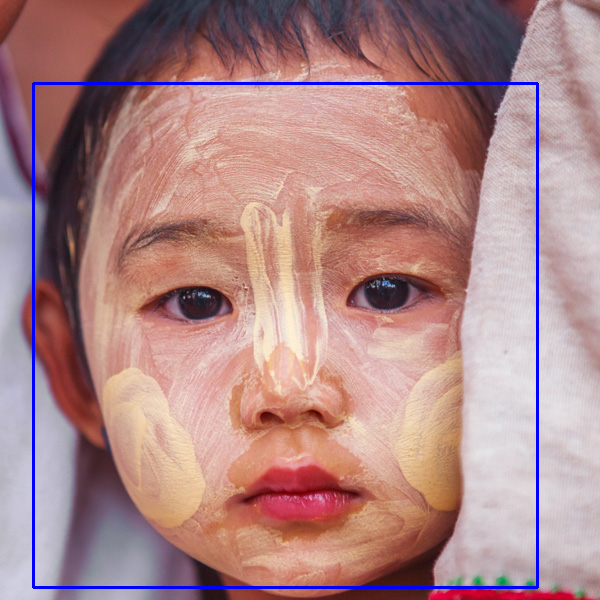

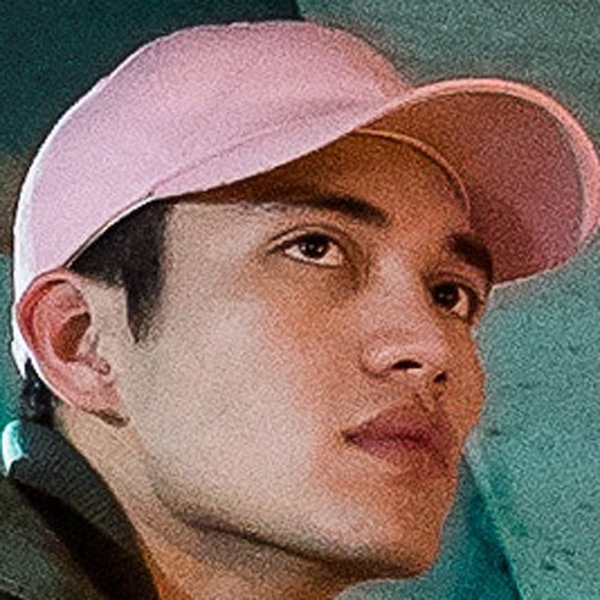

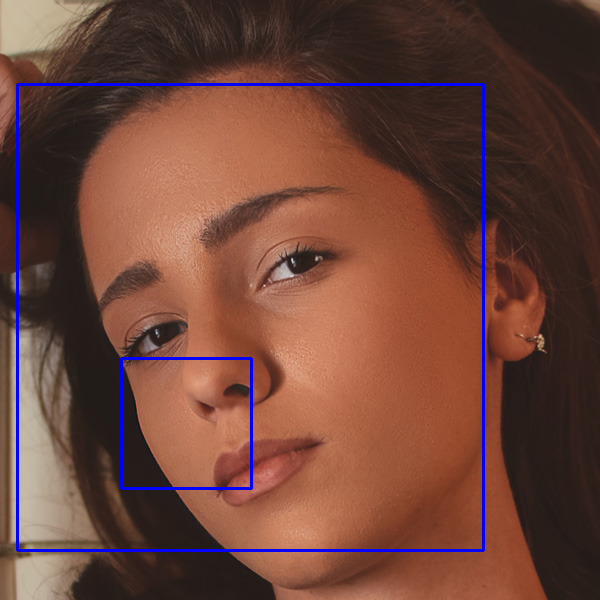

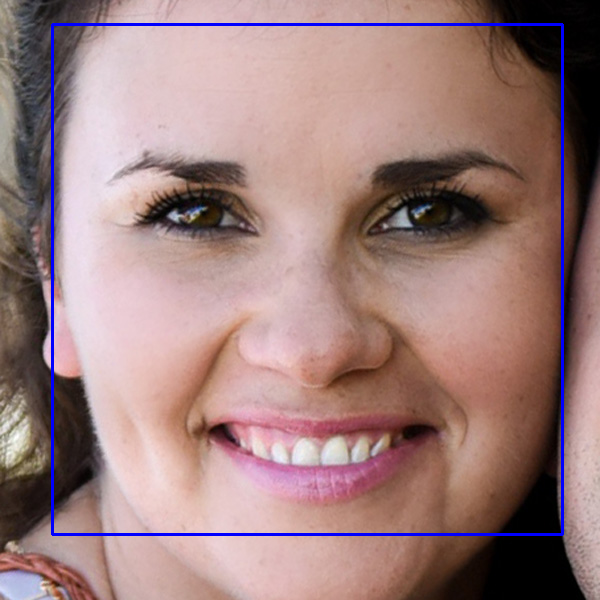

In [46]:
import cv2
import os
from google.colab.patches import cv2_imshow

# Path to the training images folder
training_images_folder = '/content/drive/My Drive/face_images/training_images'

# Load the face detection model (Haar Cascade)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

display_count = 0

# Iterate through all files in the folder
for filename in os.listdir(training_images_folder):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Check if it's an image file
        image_path = os.path.join(training_images_folder, filename)
        img = cv2.imread(image_path)

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Detect faces in the image
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        # Draw rectangles around the detected faces
        for (x, y, w, h) in faces:
            cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

        # Display the image with detected faces
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        # Increment display count
        display_count += 1

        # Used counter to break the loop if 7 images have been displayed due to large dataset
        if display_count == 7:
            break


# **Part B**

### Import images from folder 'training_images- Detect faces, extract metadata for the faces in all the images and write and save it into a dataframe.

In [42]:
import cv2
import os
import pandas as pd
from google.colab.patches import cv2_imshow

# Path to the training images folder
training_images_folder = '/content/drive/My Drive/face_images/training_images'

# Load the face detection model (Haar Cascade)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# List to store face metadata
face_data = []

# Iterate through all files in the folder
for filename in os.listdir(training_images_folder):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Check if it's an image file
        image_path = os.path.join(training_images_folder, filename)
        img = cv2.imread(image_path)

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Detect faces in the image
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        # Extract metadata for each detected face
        for (x, y, w, h) in faces:
            face_metadata = {
                'filename': filename,
                'x': x,
                'y': y,
                'width': w,
                'height': h
            }
            face_data.append(face_metadata)

# Create a Pandas DataFrame from the face metadata
df = pd.DataFrame(face_data)

# Display the DataFrame
print(df)

# Save the DataFrame to a CSV file (optional)
df.to_csv('face_metadata.csv', index=False)

           filename    x    y  width  height
0    real_00023.jpg   60   42    481     481
1    real_00024.jpg   64   60    503     503
2    real_00109.jpg   44   55    505     505
3    real_00069.jpg   33   83    504     504
4    real_00026.jpg   17   84    466     466
..              ...  ...  ...    ...     ...
944  real_00136.jpg   49  112    441     441
945  real_00089.jpg  102  185    405     405
946  real_00036.jpg  222  204    279     279
947  real_00166.jpg  120  169    363     363
948  real_00060.jpg   80   19    474     474

[949 rows x 5 columns]


In [43]:
data =pd.read_csv('face_metadata.csv')

In [44]:
data.head(10)

,filename,x,y,width,height
0,real_00023.jpg,60,42,481,481
1,real_00024.jpg,64,60,503,503
2,real_00109.jpg,44,55,505,505
3,real_00069.jpg,33,83,504,504
4,real_00026.jpg,17,84,466,466
5,real_00026.jpg,121,358,130,130
6,real_00128.jpg,52,24,510,510
7,real_00095.jpg,62,142,418,418
8,real_00035.jpg,112,175,392,392
9,real_00112.jpg,167,139,367,367
